In [3]:
import pandas as pd
import numpy as np
import datetime as dt

In [4]:
stock_df = pd.read_csv('Amazon.csv')
stock_df.head()

,Date,Open,High,Low,Close,Volume,Adj Close
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498


In [5]:
stock_df.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Volume       0
Adj Close    0
dtype: int64

In [6]:
stock_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1250 entries, 0 to 1249
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1250 non-null   object 
 1   Open       1250 non-null   float64
 2   High       1250 non-null   float64
 3   Low        1250 non-null   float64
 4   Close      1250 non-null   float64
 5   Volume     1250 non-null   int64  
 6   Adj Close  1250 non-null   float64
dtypes: float64(5), int64(1), object(1)
memory usage: 68.5+ KB


In [7]:
stock_df['Daily Return'] = stock_df['Adj Close'].pct_change(1)*100

In [8]:
stock_df.head(10)

,Date,Open,High,Low,Close,Volume,Adj Close,Daily Return
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,NaN
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468
5,1/9/2018,62.845001,62.966499,62.088001,62.634998,73226000,62.634998,0.467571
6,1/10/2018,62.257500,62.716499,61.861500,62.716499,53720000,62.716499,0.130121
7,1/11/2018,62.987000,63.838501,62.823002,63.834000,62500000,63.834000,1.781828
8,1/12/2018,63.669498,65.288002,63.669498,65.260002,108874000,65.260002,2.233923
9,1/16/2018,66.150002,66.997002,64.614998,65.242996,144414000,65.242996,-0.026059


In [9]:
stock_df['Daily Return'].replace(np.nan,0,inplace=True)
stock_df

C:\Users\RDJ007\AppData\Local\Temp\ipykernel_14472\1069298868.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  stock_df['Daily Return'].replace(np.nan,0,inplace=True)


,Date,Open,High,Low,Close,Volume,Adj Close,Daily Return
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,0.000000
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468
...,...,...,...,...,...,...,...,...
1245,12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003,1.638800
1246,12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998,2.142457
1247,12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002,-0.983886
1248,12/15/2022,89.889999,89.970001,87.470001,88.449997,84802900,88.449997,-3.417782


In [10]:
stock_df.describe().round(2)

,Open,High,Low,Close,Volume,Adj Close,Daily Return
count,1250.00,1250.00,1250.00,1250.00,1.250000e+03,1250.00,1250.00
mean,120.15,121.59,118.54,120.07,8.670803e+07,120.07,0.06
std,35.66,36.04,35.23,35.59,4.077817e+07,35.59,2.25
min,58.60,59.50,58.53,59.45,1.762600e+07,59.45,-14.05
25%,89.21,89.90,88.10,89.13,5.897078e+07,89.13,-1.04
50%,108.29,111.70,106.86,108.73,7.515300e+07,108.73,0.12
75%,158.39,160.05,156.28,158.11,1.027046e+08,158.11,1.17
max,187.20,188.65,184.84,186.57,3.113460e+08,186.57,13.54


In [11]:
import plotly.express as px

In [12]:
fig = px.line(title="Amazon.com INC (AMZN) adjusted closing price[$]")
fig.add_scatter(x=stock_df['Date'], y=stock_df['Adj Close'], name= 'Adj close')

In [13]:
def financial_plot(df, title):
    fig = px.line(title=title)

    for i in df.columns[1:]:
        fig.add_scatter(x=df['Date'], y=df[i], name= i)
        fig.update_traces(line_width= 3)
        fig.update_layout({'plot_bgcolor' : "white"})

    df['Date'] = pd.to_datetime(df['Date'])
    fig.update_xaxes(tickformat="%d-%b-%Y")

    fig.show()

In [14]:
financial_plot(stock_df.drop(['Volume','Daily Return'], axis=1), "Amazon.com INC (AMZN) Stock price[$]")

In [15]:
financial_plot(stock_df.iloc[:,[0,5]], "Amazon.com INC (AMZN) Trading volume")

C:\Users\RDJ007\AppData\Local\Temp\ipykernel_14472\530847936.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [16]:
financial_plot(stock_df.iloc[:,[0,7]], "Amazon.com INC (AMZN) Daily return")

C:\Users\RDJ007\AppData\Local\Temp\ipykernel_14472\530847936.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [17]:
def percentage_return_classifier(percentage_return):

    if percentage_return > -0.3 and percentage_return <= 0.3:
        return 'Insignificant change'
    elif percentage_return > 0.3 and percentage_return <= 3:
        return 'Positive change'
    elif percentage_return > -3 and percentage_return <= -0.3:
        return 'Negative change'
    elif percentage_return > 3 and percentage_return <= 7:
        return 'Large positive change'
    elif percentage_return > -7 and percentage_return <= -3:
        return 'Large negative change'
    elif percentage_return > 7:
        return 'Bull run'
    elif percentage_return <= -7:
        return 'Bear sell off'

In [18]:
stock_df['Trend'] = stock_df['Daily Return'].apply(percentage_return_classifier)
stock_df

,Date,Open,High,Low,Close,Volume,Adj Close,Daily Return,Trend
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,0.000000,Insignificant change
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531,Positive change
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601,Positive change
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252,Positive change
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468,Positive change
...,...,...,...,...,...,...,...,...,...
1245,12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003,1.638800,Positive change
1246,12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998,2.142457,Positive change
1247,12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002,-0.983886,Negative change
1248,12/15/2022,89.889999,89.970001,87.470001,88.449997,84802900,88.449997,-3.417782,Large negative change


In [19]:
trend_summary = stock_df['Trend'].value_counts()
trend_summary

Trend
Positive change          470
Negative change          405
Insignificant change     190
Large positive change     86
Large negative change     82
Bear sell off              9
Bull run                   8
Name: count, dtype: int64

<Axes: ylabel='count'>

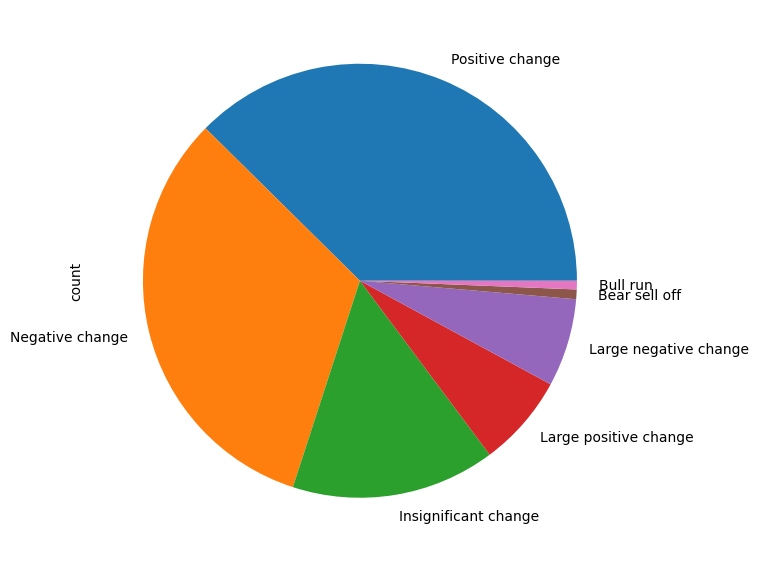

In [20]:
import matplotlib.pyplot as plt

plt.figure(figsize=(7,8))
trend_summary.plot(kind='pie', y='trend')


In [21]:
!pip install cufflinks

In [22]:
import cufflinks as cf
cf.go_offline()

In [23]:
stock_df

,Date,Open,High,Low,Close,Volume,Adj Close,Daily Return,Trend
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,0.000000,Insignificant change
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531,Positive change
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601,Positive change
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252,Positive change
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468,Positive change
...,...,...,...,...,...,...,...,...,...
1245,12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003,1.638800,Positive change
1246,12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998,2.142457,Positive change
1247,12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002,-0.983886,Negative change
1248,12/15/2022,89.889999,89.970001,87.470001,88.449997,84802900,88.449997,-3.417782,Large negative change


In [24]:
stock_df.set_index('Date', inplace=True)
stock_df

,Open,High,Low,Close,Volume,Adj Close,Daily Return,Trend
Date,,,,,,,,
1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,0.000000,Insignificant change
1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531,Positive change
1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601,Positive change
1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252,Positive change
1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468,Positive change
...,...,...,...,...,...,...,...,...
12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003,1.638800,Positive change
12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998,2.142457,Positive change
12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002,-0.983886,Negative change


In [25]:
figure = cf.QuantFig(stock_df, title='Amazon.com INC (AMZN) Candlestick chart', name = 'AMZN')
figure.add_rsi(periods=14, color='java')
figure.add_bollinger_bands(periods=20, boll_std=2, colors=['magenta', 'grey'], fill=True)
#figure.add_sma(periods=[14,21], column= 'Close', colors=['magenta', 'grey'])
figure.add_sma(periods=[14, 21], column='Close', colors=['magenta', 'grey'])
#figure.add_volume()
figure.iplot(theme="white", up_color="green", down_color="red")
#figure.iplot(theme="white", up_color="green", down_color="red")
#figure.iplot(as_candlestick=True, theme="white", up_color="green", down_color="red")

In [26]:
close_prices_df = pd.read_csv("stock_prices.csv")
close_prices_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,19.898500,69.512543,75.620926,14.121004,27.855856,71.443314,45.640057,54.709999,20.879053,61.941517
1,1/3/2014,19.822001,69.473892,75.956062,13.835152,27.652653,72.086861,45.992889,54.560001,20.920183,61.872295
2,1/6/2014,19.681499,68.561180,75.327690,13.923512,27.960960,72.463608,46.259468,57.200001,20.940746,62.018425
3,1/7/2014,19.901501,68.785461,75.662811,13.996271,28.500000,74.001869,45.726311,57.919998,21.070980,62.618301
4,1/8/2014,20.096001,68.947906,74.850121,13.965082,28.559309,73.899841,46.157543,58.230000,21.214928,61.710812
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,90.550003,233.059998,437.049988,42.500000,93.309998,177.839996,134.210007,114.709999,52.160000,152.470001
2253,12/13/2022,92.489998,235.490005,437.190002,42.540001,95.629997,179.210007,134.080002,120.150002,53.070000,152.240005
2254,12/14/2022,91.580002,234.479996,438.440002,42.820000,95.070000,179.759995,133.410004,121.589996,54.480000,152.839996
2255,12/15/2022,88.449997,230.660004,429.790008,42.380001,90.860001,177.490005,130.100006,116.150002,53.610001,151.110001


In [27]:
daily_returns_df = close_prices_df.iloc[:,1:].pct_change()*100
daily_returns_df.replace(np.nan, 0, inplace = True)
daily_returns_df

,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,-0.384451,-0.055602,0.443179,-2.024307,-0.729481,0.900780,0.773077,-0.274169,0.196992,-0.111753
2,-0.708814,-1.313748,-0.827284,0.638662,1.114930,0.522629,0.579608,4.838708,0.098293,0.236179
3,1.117807,0.327126,0.444884,0.522567,1.927829,2.122805,-1.152537,1.258737,0.621916,0.967255
4,0.977313,0.236162,-1.074095,-0.222838,0.208102,-0.137872,0.943073,0.535223,0.683156,-1.449240
...,...,...,...,...,...,...,...,...,...,...
2252,1.638800,2.538609,0.515165,2.607441,0.517070,1.194942,1.551152,-1.026749,0.850732,1.027036
2253,2.142457,1.042653,0.032036,0.094120,2.486336,0.770361,-0.096867,4.742396,1.744632,-0.150847
2254,-0.983886,-0.428897,0.285917,0.658201,-0.585588,0.306896,-0.499700,1.198498,2.656868,0.394108
2255,-3.417782,-1.629133,-1.972903,-1.027554,-4.428315,-1.262789,-2.481072,-4.474048,-1.596914,-1.131900


In [28]:
daily_returns_df.insert(0, "Date", close_prices_df['Date'])

In [29]:
daily_returns_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1/3/2014,-0.384451,-0.055602,0.443179,-2.024307,-0.729481,0.900780,0.773077,-0.274169,0.196992,-0.111753
2,1/6/2014,-0.708814,-1.313748,-0.827284,0.638662,1.114930,0.522629,0.579608,4.838708,0.098293,0.236179
3,1/7/2014,1.117807,0.327126,0.444884,0.522567,1.927829,2.122805,-1.152537,1.258737,0.621916,0.967255
4,1/8/2014,0.977313,0.236162,-1.074095,-0.222838,0.208102,-0.137872,0.943073,0.535223,0.683156,-1.449240
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,1.638800,2.538609,0.515165,2.607441,0.517070,1.194942,1.551152,-1.026749,0.850732,1.027036
2253,12/13/2022,2.142457,1.042653,0.032036,0.094120,2.486336,0.770361,-0.096867,4.742396,1.744632,-0.150847
2254,12/14/2022,-0.983886,-0.428897,0.285917,0.658201,-0.585588,0.306896,-0.499700,1.198498,2.656868,0.394108
2255,12/15/2022,-3.417782,-1.629133,-1.972903,-1.027554,-4.428315,-1.262789,-2.481072,-4.474048,-1.596914,-1.131900


In [30]:
financial_plot(close_prices_df,"Adjusted closing price [$]")

In [31]:
financial_plot(daily_returns_df,"Percentage daily returns [$]")

In [32]:
fig = px.histogram(daily_returns_df.drop(columns = ["Date"]))
fig.update_layout({'plot_bgcolor': "white"})

In [33]:
import seaborn as sns

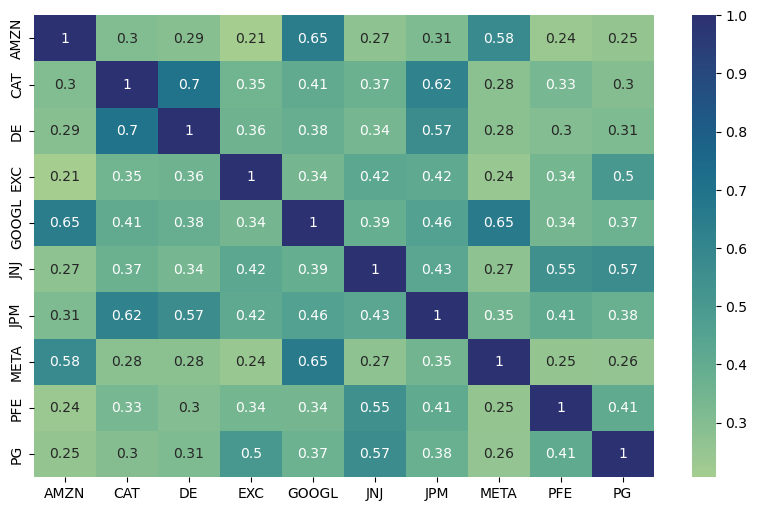

In [34]:
plt.figure(figsize=[10,6])
sns.heatmap(daily_returns_df.drop(columns=["Date"]).corr(),annot= True, cmap="crest");

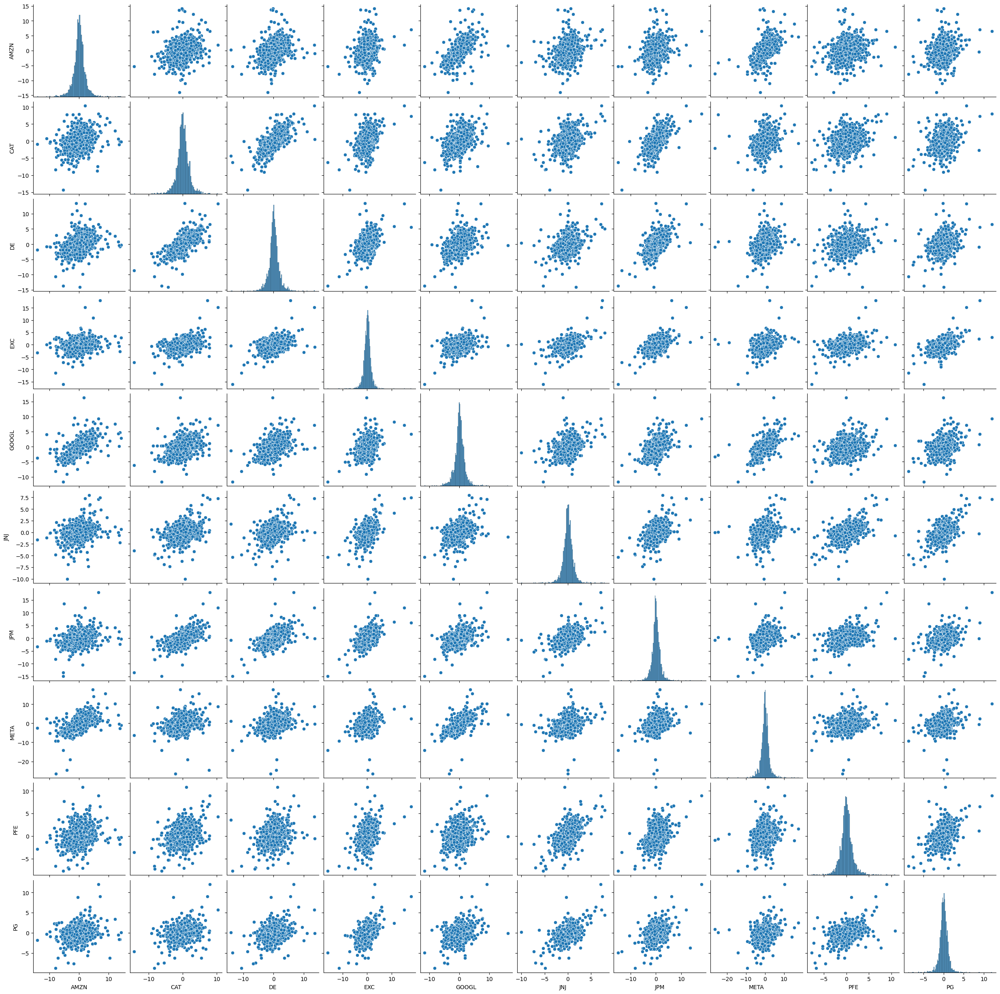

In [35]:
sns.pairplot(daily_returns_df);

In [36]:
# want to set all the prices to start at value 1 so that I can see my investments over time 
def price_scaling(raw_prices_df):
    scaled_prices_df = raw_prices_df.copy()
    for i in raw_prices_df.columns[1:]:
        scaled_prices_df[i] = raw_prices_df[i]/raw_prices_df[i][0]
    return scaled_prices_df

In [37]:
price_scaling(close_prices_df)

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,2014-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2014-01-03,0.996155,0.999444,1.004432,0.979757,0.992705,1.009008,1.007731,0.997258,1.001970,0.998882
2,2014-01-06,0.989095,0.986314,0.996122,0.986014,1.003773,1.014281,1.013572,1.045513,1.002955,1.001242
3,2014-01-07,1.000151,0.989540,1.000554,0.991167,1.023124,1.035812,1.001890,1.058673,1.009192,1.010926
4,2014-01-08,1.009925,0.991877,0.989807,0.988958,1.025253,1.034384,1.011338,1.064339,1.016087,0.996275
...,...,...,...,...,...,...,...,...,...,...,...
2252,2022-12-12,4.550594,3.352776,5.779485,3.009701,3.349744,2.489246,2.940619,2.096692,2.498198,2.461515
2253,2022-12-13,4.648089,3.387734,5.781336,3.012534,3.433030,2.508422,2.937770,2.196125,2.541782,2.457802
2254,2022-12-14,4.602357,3.373204,5.797866,3.032362,3.412927,2.516121,2.923090,2.222446,2.609314,2.467489
2255,2022-12-15,4.445058,3.318250,5.683480,3.001203,3.261792,2.484347,2.850566,2.123012,2.567645,2.439559


In [38]:
financial_plot(price_scaling(close_prices_df), "Scaled prices")

### Random weight generation

In [40]:
import random

def portfolio_weight_generation(n):
    weights = []
    for i in range(n):
        weights.append(random.random())
    
    weights = weights/np.sum(weights)
    return weights

In [41]:
weights = portfolio_weight_generation(10)
print(weights)

[0.07307595 0.03976802 0.12957574 0.09008053 0.09570124 0.10181999
 0.19088182 0.15828769 0.06655204 0.05425697]


### Asset allocation
Assumptions:

Assuming initial $1MN investmesnts across 10 above stocks with randomly generated weights.                                                                            
Assuming random weights, if specific weights are given then insert that only.

In [43]:
portfolio_df = close_prices_df.copy()
scaled_df = price_scaling(portfolio_df)
scaled_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,2014-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2014-01-03,0.996155,0.999444,1.004432,0.979757,0.992705,1.009008,1.007731,0.997258,1.001970,0.998882
2,2014-01-06,0.989095,0.986314,0.996122,0.986014,1.003773,1.014281,1.013572,1.045513,1.002955,1.001242
3,2014-01-07,1.000151,0.989540,1.000554,0.991167,1.023124,1.035812,1.001890,1.058673,1.009192,1.010926
4,2014-01-08,1.009925,0.991877,0.989807,0.988958,1.025253,1.034384,1.011338,1.064339,1.016087,0.996275
...,...,...,...,...,...,...,...,...,...,...,...
2252,2022-12-12,4.550594,3.352776,5.779485,3.009701,3.349744,2.489246,2.940619,2.096692,2.498198,2.461515
2253,2022-12-13,4.648089,3.387734,5.781336,3.012534,3.433030,2.508422,2.937770,2.196125,2.541782,2.457802
2254,2022-12-14,4.602357,3.373204,5.797866,3.032362,3.412927,2.516121,2.923090,2.222446,2.609314,2.467489
2255,2022-12-15,4.445058,3.318250,5.683480,3.001203,3.261792,2.484347,2.850566,2.123012,2.567645,2.439559


In [44]:
initial_investment = 1000000
for i, stock in enumerate(scaled_df.columns[1:]):
    portfolio_df[stock] = weights[i] * scaled_df[stock]  * initial_investment
portfolio_df.round(1)

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,2014-01-02,73075.9,39768.0,129575.7,90080.5,95701.2,101820.0,190881.8,158287.7,66552.0,54257.0
1,2014-01-03,72795.0,39745.9,130150.0,88257.0,95003.1,102737.2,192357.5,157853.7,66683.1,54196.3
2,2014-01-06,72279.0,39223.7,129073.3,88820.7,96062.3,103274.1,193472.4,165491.8,66748.7,54324.3
3,2014-01-07,73087.0,39352.1,129647.5,89284.8,97914.3,105466.4,191242.6,167574.9,67163.8,54849.8
4,2014-01-08,73801.3,39445.0,128255.0,89085.9,98118.0,105321.0,193046.1,168471.8,67622.6,54054.9
...,...,...,...,...,...,...,...,...,...,...,...
2252,2022-12-12,332539.0,133333.3,748881.0,271115.5,320574.7,253455.0,561310.7,331880.5,166260.1,133554.4
2253,2022-12-13,339663.5,134723.5,749120.9,271370.6,328545.3,255407.5,560766.9,347619.6,169160.8,133352.9
2254,2022-12-14,336321.6,134145.7,751262.8,273156.8,326621.3,256191.4,557964.8,351785.8,173655.1,133878.5
2255,2022-12-15,324826.9,131960.2,736441.1,270350.0,312157.5,252956.2,544121.3,336046.7,170882.0,132363.1


In [45]:
def asset_allocation(df, weights,initial_investment):
    portfolio_df = df.copy()
    
    scaled_df = price_scaling(df)

    for i, stock in enumerate(scaled_df.columns[1:]):
        portfolio_df[stock] = weights[i] * scaled_df[stock] * initial_investment

    portfolio_df["Portfolio Value [$]"]=portfolio_df[portfolio_df!='Date'].sum(axis=1, numeric_only=True)

    portfolio_df["Portfolio daily return [$]"] = portfolio_df['Portfolio Value [$]'].pct_change()*100
    portfolio_df.replace(np.nan, 0, inplace=True)

    return portfolio_df

In [46]:
portfolio_df = asset_allocation(close_prices_df, weights, 1000000)
portfolio_df.round(2)

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG,Portfolio Value [$],Portfolio daily return [$]
0,2014-01-02,73075.95,39768.02,129575.74,90080.53,95701.24,101819.99,190881.82,158287.69,66552.04,54256.97,1000000.00,0.00
1,2014-01-03,72795.01,39745.91,130150.00,88257.02,95003.12,102737.17,192357.48,157853.72,66683.14,54196.34,999778.90,-0.02
2,2014-01-06,72279.03,39223.75,129073.29,88820.69,96062.34,103274.10,193472.41,165491.80,66748.68,54324.34,1008770.41,0.90
3,2014-01-07,73086.97,39352.06,129647.51,89284.84,97914.26,105466.41,191242.56,167574.90,67163.80,54849.79,1015583.11,0.68
4,2014-01-08,73801.25,39445.00,128254.98,89085.88,98118.02,105321.00,193046.12,168471.80,67622.64,54054.89,1017221.57,0.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2252,2022-12-12,332538.99,133333.28,748881.03,271115.46,320574.71,253455.02,561310.67,331880.49,166260.13,133554.37,3252904.15,0.99
2253,2022-12-13,339663.50,134723.48,749120.94,271370.64,328545.27,255407.54,560766.94,347619.57,169160.76,133352.91,3289731.56,1.13
2254,2022-12-14,336321.60,134145.66,751262.81,273156.80,326621.35,256191.38,557964.79,351785.78,173655.14,133878.46,3294983.77,0.16
2255,2022-12-15,324826.86,131960.25,736441.12,270349.97,312157.53,252956.22,544121.28,336046.72,170882.02,132363.09,3212105.06,-2.52


In [47]:
financial_plot(portfolio_df[["Date","Portfolio daily return [$]"]], "Portfolio percentage daily return")

In [48]:
financial_plot(portfolio_df[["Date","Portfolio Value [$]"]], "Portfolio actual value return")

In [49]:
financial_plot(portfolio_df.drop(columns=['Portfolio Value [$]','Portfolio daily return [$]']),"Each stock return")

In [192]:
def simulation_engine(weights, initial_investment):

    portfolio_df = asset_allocation(close_prices_df, weights, initial_investment)

    return_on_investment = ((portfolio_df['Portfolio Value [$]'][-1:] - 
                             portfolio_df['Portfolio Value [$]'][0])/ 
                             portfolio_df['Portfolio Value [$]'][0]) * 100

    portfolio_daily_return_df = portfolio_df.drop(columns = ['Date', 'Portfolio Value [$]', 'Portfolio daily return [$]'])
    portfolio_daily_return_df = portfolio_daily_return_df.pct_change(1) 

    expected_portfolio_return = np.sum(weights * portfolio_daily_return_df.mean() ) * 252
    
    covariance = portfolio_daily_return_df.cov() * 252 
    expected_volatility = np.sqrt(np.dot(weights.T, np.dot(covariance, weights)))
    
    rf = 0.035 #risk free rate at the end of 2022
    
    sharpe_ratio = (expected_portfolio_return - rf)/expected_volatility 
    return expected_portfolio_return, expected_volatility, sharpe_ratio, portfolio_df['Portfolio Value [$]'][-1:].values[0], return_on_investment.values[0]

In [194]:
initial_investment = 1000000
portfolio_metrics = simulation_engine(weights, initial_investment)

In [196]:
print('Expected Portfolio Annual Return = {:.2f}%'.format(portfolio_metrics[0] * 100))
print('Portfolio Standard Deviation (Volatility) = {:.2f}%'.format(portfolio_metrics[1] * 100))
print('Sharpe Ratio = {:.2f}'.format(portfolio_metrics[2]))
print('Portfolio Final Value = ${:.2f}'.format(portfolio_metrics[3]))
print('Return on Investment = {:.2f}%'.format(portfolio_metrics[4]))

Expected Portfolio Annual Return = 16.04%
Portfolio Standard Deviation (Volatility) = 17.01%
Sharpe Ratio = 0.74
Portfolio Final Value = $3213742.52
Return on Investment = 221.37%


### Monte Carlo Simulations

In [199]:
sim_runs = 100
#n = weight_runs.shape[1]
n=10
initial_investment = 1000000

weight_runs = np.zeros((sim_runs,n))


sharpe_ratio_runs = np.zeros(sim_runs)

expected_portfolio_return_runs = np.zeros(sim_runs)

volatility_runs = np.zeros(sim_runs)

return_on_investment_runs = np.zeros(sim_runs)

final_values_runs = np.zeros(sim_runs)

for i in range(sim_runs):

    weights = portfolio_weight_generation(n)

    weight_runs[i,:] = weights
    
    expected_portfolio_return_runs[i], volatility_runs[i], sharpe_ratio_runs[i], final_values_runs[i], return_on_investment_runs[i] = simulation_engine(weights, initial_investment)
    print("Simulation Run = {}".format(i))   
    print("Weights = {}, Final Value = ${:.2f}, Sharpe Ratio = {:.2f}".format(weight_runs[i].round(3), final_values_runs[i], sharpe_ratio_runs[i]))   
    print('\n')


Simulation Run = 0
Weights = [0.09  0.066 0.113 0.006 0.003 0.184 0.123 0.141 0.174 0.103], Final Value = $3069452.18, Sharpe Ratio = 0.69


Simulation Run = 1
Weights = [0.165 0.05  0.048 0.047 0.178 0.106 0.06  0.112 0.12  0.115], Final Value = $3131939.33, Sharpe Ratio = 0.68


Simulation Run = 2
Weights = [0.166 0.189 0.132 0.028 0.048 0.048 0.13  0.006 0.136 0.117], Final Value = $3476586.59, Sharpe Ratio = 0.73


Simulation Run = 3
Weights = [0.039 0.18  0.039 0.004 0.056 0.15  0.191 0.128 0.077 0.135], Final Value = $2898777.25, Sharpe Ratio = 0.64


Simulation Run = 4
Weights = [0.026 0.168 0.13  0.074 0.128 0.135 0.052 0.125 0.052 0.111], Final Value = $3200060.54, Sharpe Ratio = 0.69


Simulation Run = 5
Weights = [0.136 0.146 0.015 0.158 0.162 0.016 0.128 0.129 0.004 0.108], Final Value = $3118306.91, Sharpe Ratio = 0.66


Simulation Run = 6
Weights = [0.125 0.085 0.189 0.04  0.075 0.096 0.053 0.096 0.093 0.148], Final Value = $3459062.25, Sharpe Ratio = 0.74


Simulation Ru

In [253]:
sharpe_ratio_runs

array([0.68705802, 0.67759902, 0.73184411, 0.64114971, 0.69411339,
       0.66268488, 0.74499705, 0.63512504, 0.68784824, 0.68648812,
       0.71600236, 0.70522515, 0.67939041, 0.69768789, 0.63436387,
       0.66772974, 0.61997874, 0.69532053, 0.69536666, 0.68802506,
       0.63862295, 0.66443313, 0.68696603, 0.6803914 , 0.70075526,
       0.73961134, 0.73676401, 0.70893938, 0.70751088, 0.68236447,
       0.66696501, 0.68943513, 0.67470913, 0.66913011, 0.71419393,
       0.67834893, 0.74609042, 0.61675153, 0.60959401, 0.63134499,
       0.75423752, 0.69500272, 0.72241294, 0.73830318, 0.70545709,
       0.63085639, 0.70271176, 0.69797388, 0.71044707, 0.65191536,
       0.74952076, 0.68885269, 0.66642693, 0.71593543, 0.70151882,
       0.75783011, 0.74104933, 0.66700981, 0.69806778, 0.66006645,
       0.72601808, 0.72221369, 0.70853416, 0.67118289, 0.71337311,
       0.65898187, 0.68062563, 0.65568793, 0.66054561, 0.66640597,
       0.70679692, 0.67901765, 0.62221805, 0.6639664 , 0.67195

In [267]:
sharpe_ratio_runs.max()

0.7578301149343443

In [269]:
sharpe_ratio_runs.argmax()

55

In [271]:
weight_runs

array([[8.97154292e-02, 6.56643859e-02, 1.13341367e-01, 5.53594064e-03,
        2.50411173e-03, 1.83683020e-01, 1.22597038e-01, 1.40643428e-01,
        1.73792194e-01, 1.02523086e-01],
       [1.64792182e-01, 4.97423046e-02, 4.78990063e-02, 4.69743786e-02,
        1.77672222e-01, 1.05922283e-01, 5.96065071e-02, 1.11759376e-01,
        1.20455743e-01, 1.15175998e-01],
       [1.65832315e-01, 1.88857680e-01, 1.32483746e-01, 2.77317352e-02,
        4.82868246e-02, 4.77273848e-02, 1.30494787e-01, 6.13431662e-03,
        1.35813516e-01, 1.16637695e-01],
       [3.89373116e-02, 1.79992397e-01, 3.86885483e-02, 4.13864830e-03,
        5.62093233e-02, 1.50396100e-01, 1.91123058e-01, 1.28173002e-01,
        7.69977135e-02, 1.35343898e-01],
       [2.56105011e-02, 1.67835074e-01, 1.30286745e-01, 7.40441607e-02,
        1.27895145e-01, 1.34587197e-01, 5.18205039e-02, 1.24740952e-01,
        5.24391625e-02, 1.10740559e-01],
       [1.35950196e-01, 1.45619243e-01, 1.46880914e-02, 1.57692171e-01,
   

In [273]:
weight_runs[sharpe_ratio_runs.argmax(),:]

array([0.15045323, 0.12892049, 0.17902064, 0.11965829, 0.09451161,
       0.02862971, 0.05780754, 0.04499074, 0.06066186, 0.13534589])

In [275]:
optimal_portfolio_return, optimal_volatility, optimal_sharpe_ratio, highest_final_value, optimal_return_on_investment = simulation_engine(weight_runs[sharpe_ratio_runs.argmax(),:], initial_investment)

In [277]:
print('Best Portfolio Metrics Based on {} Monte Carlo Simulation Runs:'.format(sim_runs))
print('  - Portfolio Expected Annual Return = {:.02f}%'.format(optimal_portfolio_return * 100))
print('  - Portfolio Standard Deviation (Volatility) = {:.02f}%'.format(optimal_volatility * 100))
print('  - Sharpe Ratio = {:.02f}'.format(optimal_sharpe_ratio))
print('  - Final Value = ${:.02f}'.format(highest_final_value))
print('  - Return on Investment = {:.02f}%'.format(optimal_return_on_investment))

Best Portfolio Metrics Based on 100 Monte Carlo Simulation Runs:
  - Portfolio Expected Annual Return = 17.57%
  - Portfolio Standard Deviation (Volatility) = 18.57%
  - Sharpe Ratio = 0.76
  - Final Value = $3588434.01
  - Return on Investment = 258.84%


In [304]:
sim_out_df = pd.DataFrame({'Volatility' :volatility_runs.tolist(),'Portfolio_return' : expected_portfolio_return_runs.tolist(),
                          'Sharpe_ratio' :sharpe_ratio_runs.tolist()})
sim_out_df

,Volatility,Portfolio_return,Sharpe_ratio
0,0.176224,0.156076,0.687058
1,0.186944,0.161673,0.677599
2,0.186535,0.171515,0.731844
3,0.183671,0.152761,0.641150
4,0.183495,0.162366,0.694113
...,...,...,...
95,0.186645,0.168733,0.716511
96,0.190815,0.162616,0.668797
97,0.178514,0.159942,0.699903
98,0.180363,0.157511,0.679247


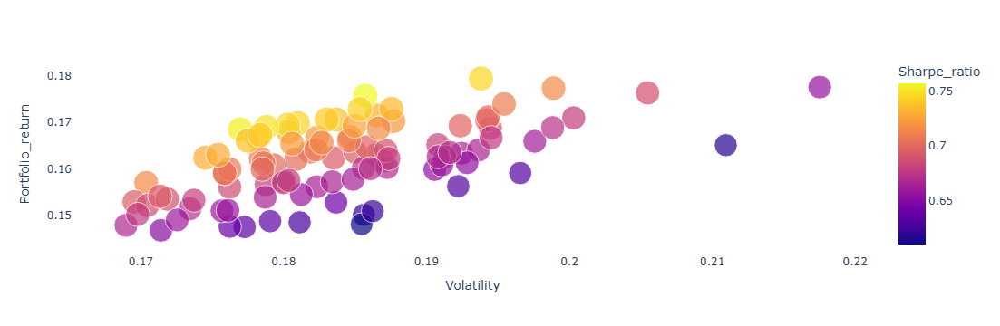

In [308]:
import plotly.graph_objects as go
fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_return', color = 'Sharpe_ratio', size = 'Sharpe_ratio', hover_data = ['Sharpe_ratio'] )
fig.update_layout({'plot_bgcolor': "white"})
fig.show()

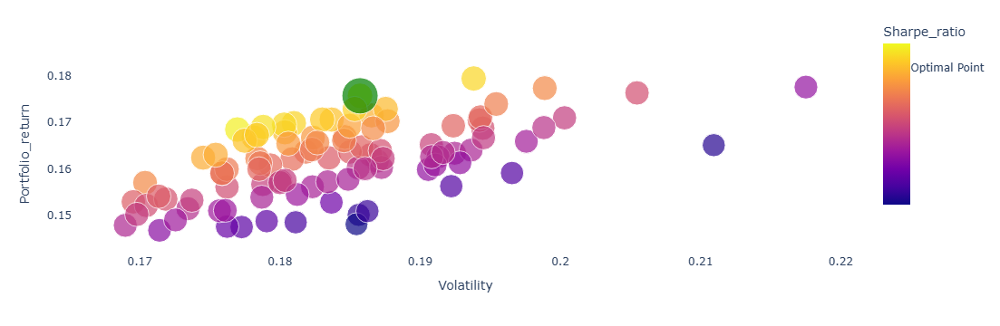

In [312]:
fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_return', color = 'Sharpe_ratio', size = 'Sharpe_ratio', hover_data = ['Sharpe_ratio'] )
fig.add_trace(go.Scatter(x = [optimal_volatility], y = [optimal_portfolio_return], mode = 'markers', name = 'Optimal Point', marker = dict(size=[40], color = 'green')))
fig.update_layout(coloraxis_colorbar = dict(y = 0.7, dtick = 5))
fig.update_layout({'plot_bgcolor': "white"})
fig.show()